## Introduction
This code is written in order to evaluate the fluctuation function of a time series, without the step of integration.
We can't do this with the MFDFA library naturally, so I am writing this code from scratch.


## Imports 

In [1]:
#Imports:
from MFDFA import MFDFA
import pyspedas
import matplotlib.pyplot as plt
import numpy as np
from pyspedas import tplot
from scipy import signal 

## Loading the data 

19-Feb-25 23:51:14: Loading pydata/mms1/fgm/srvy/l2/2024/03/mms1_fgm_srvy_l2_20240310_v5.442.0.cdf
19-Feb-25 23:51:17: /home/scoscia/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(



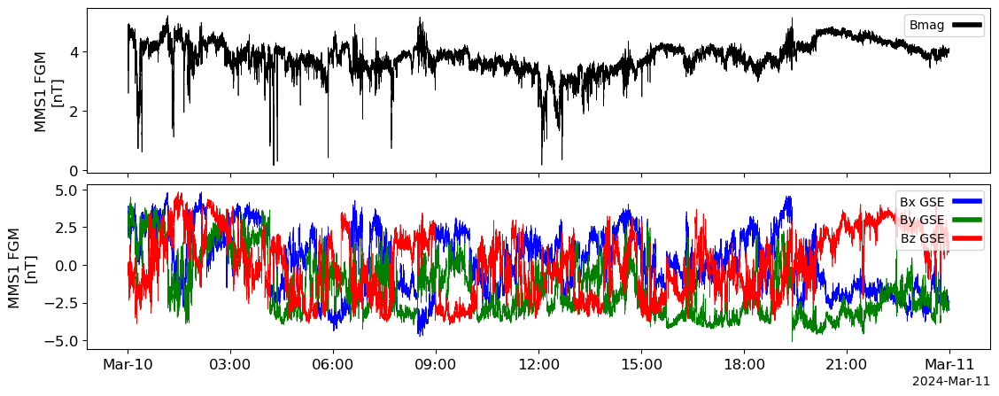

loaded data!


In [2]:
#Here we gather the MMS1 data using Pyspedas:
pyspedas.mms.fgm(time_clip=True,probe=1,trange=["2024-03-10","2024-03-11"])

#Plot the data: 
t_plot=tplot(['mms1_fgm_b_gse_srvy_l2_btot', 'mms1_fgm_b_gse_srvy_l2_bvec'])

#Get data to be put in array format:
magdata=pyspedas.get_data("mms1_fgm_b_gse_srvy_l2_btot")

#extract time and B-field magnitudes:
times=magdata.times
bmag=magdata.y

print("loaded data!")

In [ ]:
def variance(input,s,nu):
    # First we segment the input with length s: 
    seg_input=[input[i:i+s] for i in range(0,len(input),s)]
    # Now we sum over the specified segment:
    sum = 0
    for i in range s:
        sum = (1/s)*seg_input[(nu-1)*s+i] + sum


In [ ]:
#  This is the main function we will use to run our helper functions:
def main(timeSeries):
    # We first need to select a band of lags, varying from small segments of data to long ones:
    # These bands must be integers, since they will segment the data into chunks of side length s:
    lag = np.arange(1,len(timeSeries),1000)

    # We need to select a range of powers for the fluctuation function.
    # Gomes et al. do -20 to 20 with increments of 0.25
    qList=np.arange(-20,20,0.25).tolist()
    qList.remove(0)
    
    # First we need to find the cumulative sum of the series:
    integ_timeSeries=np.cumsum(timeSeries)
    

    #The order for the polynomial fitting is chosen by Gomes et al. as 3:
    order=3

    print(variance(integ_timeSeries,100,2))

    # Find the fluctuation function for each q, and save them to a list:
    #lag,dfaList=flucFunc(integ_timeSeries,lag,qList,order)
    


In [28]:
main(bmag)

[[array([  4.828235,   9.646345,  14.439896,  19.235603,  24.033266,
        28.824053,  33.607765,  38.41657 ,  43.219135,  48.033127,
        52.84218 ,  57.67068 ,  62.52504 ,  67.40275 ,  72.26974 ,
        77.16034 ,  82.07156 ,  86.95952 ,  91.82091 ,  96.6747  ,
       101.51201 , 106.32506 , 111.12916 , 115.93955 , 120.73179 ,
       125.53469 , 130.34222 , 135.15215 , 139.96602 , 144.77832 ,
       149.56999 , 154.33406 , 159.08604 , 163.81755 , 168.52101 ,
       173.20259 , 177.87488 , 182.53412 , 187.20238 , 191.85527 ,
       196.51366 , 201.20622 , 205.89096 , 210.55484 , 215.22287 ,
       219.90605 , 224.61465 , 229.33252 , 234.04298 , 238.7497  ,
       243.46136 , 248.18619 , 252.90788 , 257.62875 , 262.3599  ,
       267.075   , 271.77368 , 276.4941  , 281.19415 , 285.89282 ,
       290.5784  , 295.2542  , 299.93823 , 304.6255  , 309.30096 ,
       313.9861  , 318.67764 , 323.35934 , 328.067   , 332.79083 ,
       337.55096 , 342.32706 , 347.1115  , 351.9239  , 356.7